# Data Modeling with `caret`

## *C*lassification *A*nd *RE*gression *T*raining

![caret logo](img/carrot.png)

# Part 1: Machine Learning in R Without `caret`

![Crying bunny](img/BunnyCry2.jpg)

## A simple machine learning example that does not take advantage of `caret`

In [5]:
library(randomForest)

First, we load the required libraries and read our data into data frames. The following data (and most of the code) come from [kaggle](http://www.kaggle.com)'s introductory "Digit Recognizer" optical character recognition problem.

In [3]:
library(randomForest)
trainData <- read.csv("data/digits/train.csv")
trainData$label <- as.factor(trainData$label)
testData <- read.csv("data/digits/test.csv")

Let's verify that the data look properly loaded, and inspect the format.

In [3]:
dim(trainData); dim(testData); str(trainData[, 1:6])

[1] 42000   785

[1] 28000   784

'data.frame':	42000 obs. of  6 variables:
 $ label : int  1 0 1 4 0 0 7 3 5 3 ...
 $ pixel0: int  0 0 0 0 0 0 0 0 0 0 ...
 $ pixel1: int  0 0 0 0 0 0 0 0 0 0 ...
 $ pixel2: int  0 0 0 0 0 0 0 0 0 0 ...
 $ pixel3: int  0 0 0 0 0 0 0 0 0 0 ...
 $ pixel4: int  0 0 0 0 0 0 0 0 0 0 ...


We see that the first column (`label`) is the actual digit represented by an image, and the remaining 784 columns are greyscale values for each pixel in the 28x28 images.

After setting the seed to keep our results repeatable, we select a random subsample of our data and pull the predictors from the outcome.

In [15]:
set.seed(0)
numTrain <- 10000
rows <- sample(1:nrow(trainData), numTrain)
labels <- as.factor(trainData[rows,1])
subtrain <- trainData[rows,-1]

Finally, we build a random forest model on the subset of the `train` data set, computing the predicted outcomes of the test set along the way.  The actual [`randomForest`](http://www.inside-r.org/packages/cran/randomforest/docs/randomforest) function is called with four arguments, though only the first is necessary.

`randomForest(x, y=NULL, xtest=NULL, ntree=500)`

There are over a dozen additional potential parameters to pass, including `mtry`, the number of predictors to randomly sample at each break point.

In [16]:
numTrees <- 25
rf <- randomForest(subtrain, labels, xtest=testData, ntree=numTrees)
predictions <- data.frame(
    ImageId=1:nrow(testData),
    Label=levels(labels)[rf$test$predicted]
)
head(predictions)

,ImageId,Label
1,1,2
2,2,0
3,3,9
4,4,4
5,5,2
6,6,7


This went rather smoothly.  But:

- What if I want to reserve my own data set for validation before predicting on the test set?
- What if I want further details on factor selection done by the model?
- What if I simply want to try a different model?

`caret` helps will all of these things and more.

# Part 2: Data and Model Exploration in `caret`

![Carrot selection](img/varieties_of_carrots.jpg)

## Variable importance and parameter tuning

In [7]:
library(caret)
library(doMC)
registerDoMC(8)
library(RColorBrewer)

Loading required package: lattice
Loading required package: ggplot2
Loading required package: foreach
Loading required package: iterators
Loading required package: parallel


Let's improve upon kaggle's example model by applying some of `caret`'s functionality.  We begin by loading the `caret` package.  We will simultaneously load a parallel processing package `doMC` and tell it how many cores we're rocking (the Mac on which I wrote this has four cores with two threads each).  For those packages that implement some form of parallelization, `caret` does not interfere.  `randomForest` is definitely one of those packages.

See the [`caret` documentation](http://topepo.github.io/caret/parallel.html) for additional information.

In [7]:
library(caret)
library(doMC)
registerDoMC(8)

## `createDataPartition`

The first function we will want to learn is `caret`'s data partitioning function.  Here is the function call from the [documentation](http://www.inside-r.org/node/87010):

    createDataPartition(
        y, 
        times = 1,
        p = 0.5,
        list = TRUE,
        groups = min(5, length(y))
    )

This function takes `times` samples from your data vector `y` of proportion `p`.  If your data are discrete, `createDataPartition` will automatically take a representative sample from each level as best as it can; otherwise, you can use `groups` to help `caret` partition a continuous variable.

The values returned are chosen indices from `y`.

##`train`

This poorly-named function trains your model.  Again from the slimmed down [docs](http://www.inside-r.org/packages/cran/caret/docs/train):

    train(
        x,
        y, 
        method = "rf",
        ... 
    )

This call returns a `train` object, which is basically a list.  The model contained is built applying the given `method` (in this case `"rf"` means random forest) to the predictors in the data frame `x` and with associated vector of outcomes `y`.  As `caret` is really just a wrapper for the underlying packages that deploy varous methods, we can pass additional arguments through the ellipses as needed.

Let's have a look at an example.  These lines are nearly identical to those from kaggle's "benchmark" code.  A few things are different:

- I want to plot soon, so I reduced from a sample of 10,000 to one of about 1,000
- I asked `randomForest` to keep track of importance variables, which it does not do by default

You can see that we pass `list=FALSE` to `createDataPartition`; as we only have one sample, we'd like to have our row numbers in a vector so that we can easily subset our data with it.  We also used the formula implementation of the `train` function rather than slice the data frame via `train(naiveData[, -1], naive$label, ...)`.

In [20]:
set.seed(0)
inTrain <- createDataPartition(trainData$label, p=1/40, list=FALSE)
naiveData <- trainData[inTrain, ]
naiveModel <- train(
    label ~ .,
    data = naiveData,
    method="rf",
    ntree=25,
    importance=TRUE
)

## `varImp`

Since we've asked `randomForest` to keep track of importance, let's have a look at it.  The `varImp` function computes importance on a scale from 0 to 100 (by default--set `scale=FALSE` to return the raw score used).

In [21]:
varImp(naiveModel)

rf variable importance

  variables are sorted by maximum importance across the classes
  only 20 most important variables shown (out of 784)

             0     1     2     3     4     5      6     7     8     9
pixel541 61.52 64.81 64.07 13.23 72.30 35.56 100.00 59.12 51.84 66.12
pixel378 82.61 98.46 84.90 88.62 77.01 58.12  61.93 82.00 74.71 68.00
pixel318 59.12 86.95 82.19 94.40 62.16 64.72  85.19 76.38 34.27 68.28
pixel515 59.12 69.80 73.71 76.49 48.60 66.84  92.61 45.11 53.24 78.41
pixel598 67.47 59.12 62.48 67.49 70.48 59.12  34.97 67.26 74.25 91.30
pixel430 63.26 72.91 57.07 42.38 89.54 64.20  70.00 79.75 59.12 74.07
pixel290 58.78 81.45 59.12 89.32 21.37 42.88  59.12 50.41 58.28 74.77
pixel292 72.61 62.05 86.97 63.86 51.44 40.57  52.25 37.19 50.69 63.69
pixel181 43.79 59.12 45.78 48.01 86.27 49.53  63.57 79.18 25.34 52.70
pixel571 67.50 40.24 68.22 51.51 70.20 21.37  86.12 52.71 71.37 56.82
pixel210 59.12 63.00 13.15 57.05 85.81 67.51  80.77 58.51 43.88 75.57
pixel239 59.12 66

## `featurePlot`

A wrapper for various `lattice` plots.  Once more, the call string from [documentation](http://www.inside-r.org/packages/cran/caret/docs/featurePlot):

    featurePlot(
        x,
        y, 
        plot = if(is.factor(y)) "strip" else "scatter",
        ...
    )

As before, `x` holds the predictor data frame and `y` holds the outcome vector.  `plot` is a string corresponding to the type of plot you want (e.g., `"pairs"`).  `...` implies that you can add additional arguments to be passed down to the `lattice` plot call.

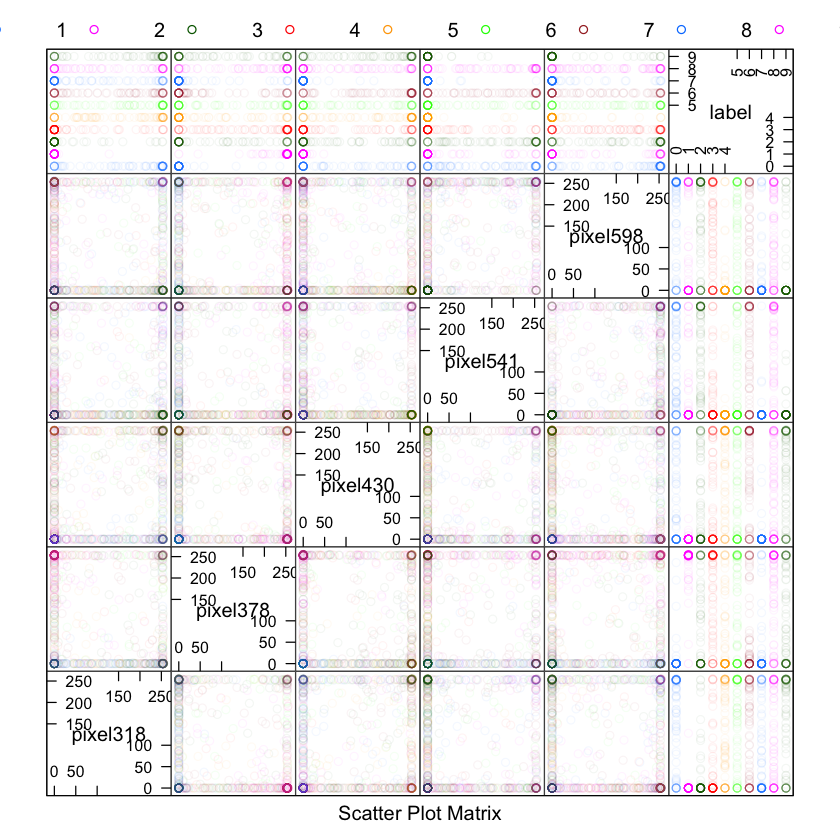

In [26]:
featurePlot(
    x = naiveData[, c(320, 380, 432, 543, 600, 1)],
    y = naiveData$label,
    plot = "pairs",
    alpha = 1/20,
    auto.key = list(columns = 10)
)

## train(tuneGrid)

As an optional argument to pass to `train`, `tuneGrid` allows you to pass in various combinations of hyperparameters to your model in an effort to optimize them.  The [`caret` documentation](http://topepo.github.io/caret/training.html#grids) has a nice example that demonstrates how you make a simple matrix of hyperparameter combinations, save it as a named matrix, and pass that in as the `tuneGrid` argument.

If you want to know what hyperparameters a particular method takes, simply call the `modelLookup` function (e.g., `modelLookup("rf")`).  What returns will be a printout of each hyperparameter by name, description, and some indicators of its intended use.  For additional details, you'll need to check the documentation of the underlying package.

**Note:** You must name your tuning grid!  `caret` will get angry if you try to pass in a call to `expand.grid`.

For `randomForest` (`method="rf"`), there is only one hyperparameter: `mtry`.  This tells `randomForest` how many of the predictors to try and split on at each node.  By default, `randomForest` takes a random sample of the square root of the total and tries to split on those.  In our case, 28 x 28 = 784 pixels means the default is 28 pixels chosen at each split.  But what if that isn't best?

In [5]:
set.seed(12345)
inTrain <- createDataPartition(trainData$label, p=0.5, list=FALSE)
fitGrid <- expand.grid(
    mtry = (1:8) * 10 - 2
)
rfModel <- train(
    label ~ .,
    data = trainData[inTrain, ],
    method="rf",
    tuneGrid=fitGrid,
    ntree=25
)

If you ask `R` to print the `train` object, it outputs a nice summary that includes (within reason) a list of the parameter combinations and the resulting 'quality' metrics (these can be changed).

In [6]:
print(rfModel)

Random Forest 

21003 samples
  784 predictor
   10 classes: '0', '1', '2', '3', '4', '5', '6', '7', '8', '9' 

No pre-processing
Resampling: Bootstrapped (25 reps) 
Summary of sample sizes: 21003, 21003, 21003, 21003, 21003, 21003, ... 
Resampling results across tuning parameters:

  mtry  Accuracy   Kappa      Accuracy SD  Kappa SD   
   8    0.9358967  0.9287435  0.003123861  0.003469168
  18    0.9424117  0.9359874  0.002589643  0.002877086
  28    0.9445155  0.9383264  0.002878136  0.003198734
  38    0.9450507  0.9389212  0.002622172  0.002913991
  48    0.9453394  0.9392426  0.002658911  0.002953523
  58    0.9460275  0.9400069  0.002009262  0.002232896
  68    0.9458082  0.9397635  0.002404315  0.002670009
  78    0.9459638  0.9399367  0.003060001  0.003401450

Accuracy was used to select the optimal model using  the largest value.
The final value used for the model was mtry = 58. 


Similarly, if you plot a `train` object, you get a graph of your metric against your hyperparameter(s).

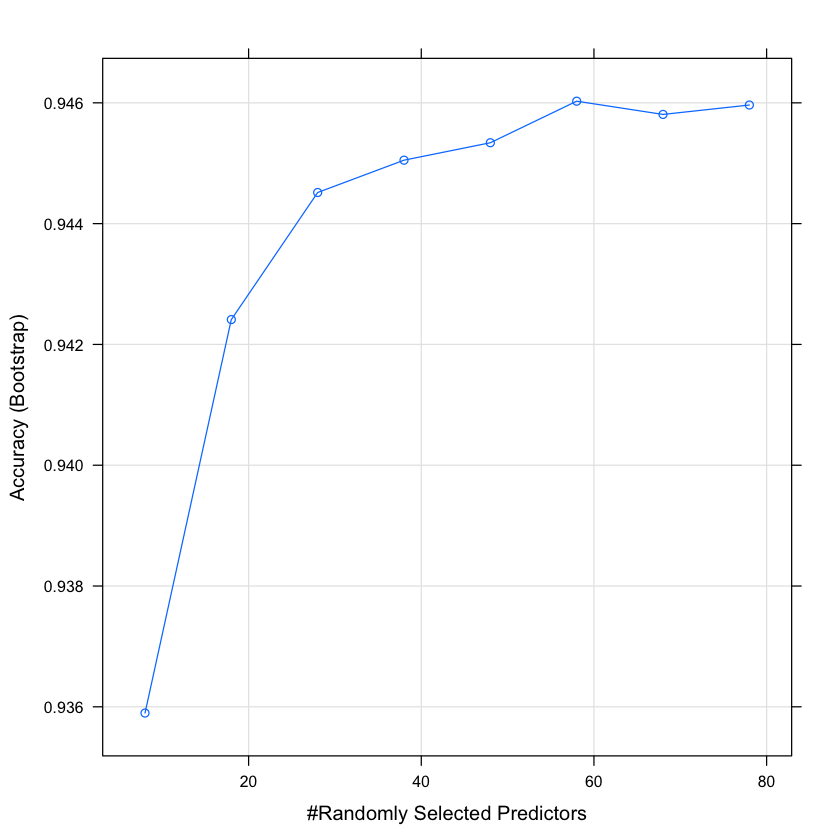

In [7]:
plot(rfModel)

Do you like `ggplot2`?  So does `caret`!

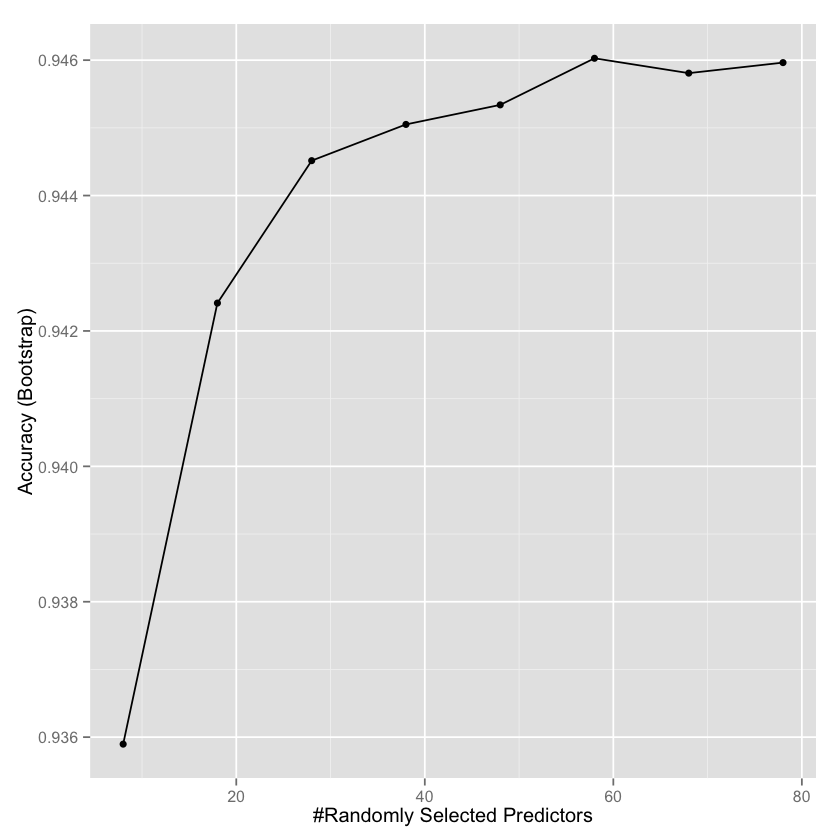

In [8]:
ggplot(rfModel)

# Part 3: Model Validation

![carrot show](img/rhs-carrots.jpg)

## Tuning and performance

In this final section, we'd like to look at a few tools that can help validate and analyze your models.  For a classification task, the most obvious such tool is the [confusion matrix](https://en.wikipedia.org/wiki/Confusion_matrix).  Perhaps unsurprisingly, `caret` has an aptly-named helper function.

## confusionMatrix.train

`caret`'s `confusionMatrix` function has two iterations, and the first applies to a `train` object.  Assuming that the outcomes of the method call were explicitly discrete, calling `confusionMatrix(myModel)` will return a simple diagram that shows how frequently each level was guessed correctly or confused for a different level.  This is simply a finer level of detail on the accuracy score we've already been shown by printing the `train` object directly.

In [9]:
confusionMatrix(rfModel)

Bootstrapped (25 reps) Confusion Matrix 

(entries are percentages of table totals)
 
          Reference
Prediction    0    1    2    3    4    5    6    7    8    9
         0  9.6  0.0  0.1  0.0  0.0  0.1  0.1  0.0  0.0  0.1
         1  0.0 10.9  0.0  0.0  0.0  0.0  0.0  0.1  0.1  0.0
         2  0.0  0.1  9.4  0.2  0.0  0.0  0.0  0.1  0.1  0.0
         3  0.0  0.0  0.1  9.5  0.0  0.2  0.0  0.0  0.2  0.1
         4  0.0  0.0  0.1  0.0  9.2  0.0  0.0  0.1  0.1  0.2
         5  0.0  0.0  0.0  0.2  0.0  8.4  0.1  0.0  0.1  0.1
         6  0.0  0.0  0.1  0.0  0.1  0.1  9.7  0.0  0.1  0.0
         7  0.0  0.0  0.1  0.1  0.0  0.0  0.0  9.9  0.0  0.1
         8  0.1  0.0  0.1  0.1  0.1  0.1  0.0  0.0  8.9  0.1
         9  0.0  0.0  0.0  0.1  0.3  0.1  0.0  0.2  0.2  9.2


## predict

What if we want to know how the model performs on data it wasn't trained on?  We'll need to apply it to other data we've been holding back (the point of `createDataPartition`), and compare that to truth values for those data.  Once again to the [docs](http://www.inside-r.org/packages/cran/caret/docs/extractPrediction):

    predict(
        object,
        newdata = NULL,
        ...
    )

Here, `object` is the `train` object we're using to predict, and `newdata` is a data frame containing the withheld data.  As with other `caret` functions, this is essentially a wrapper for the prediction functions of the various packages, so additional arguments are ocassionally necessary and can be passed through the ellipsis.

In [10]:
rfValidData <- predict(rfModel, trainData[-inTrain, ])

## confusionMatrix

Now that we have used our model to predict the outcomes for new data, we'll want to compare that to the known truth values.  This is the other (perhaps more useful) version of `confuseMatrix`.  As usual, the [docs](http://www.inside-r.org/node/86995):

    confusionMatrix(
        data,
        reference,
        ...
    )

Here, `data` is a vector of newly predicted data and `reference` are the truth values.

In [12]:
confusionMatrix(rfValidData, trainData[-inTrain, "label"])

Confusion Matrix and Statistics

          Reference
Prediction    0    1    2    3    4    5    6    7    8    9
         0 2019    0   10    8    2    5   16    2    5    9
         1    0 2298    5    1    5    3    2   14   23    6
         2    4   14 1985   31    2    2    4   31   14    8
         3    5    7   16 2011    0   54    1    7   28   34
         4    4    3   10    3 1956    4   10   10   13   45
         5   10    3    3   53    3 1789   15    2   16   11
         6   12    3   12    4    4   14 2002    0   10    3
         7    3    7   26   16    2    2    1 2098    6   20
         8    8    6   15   33    9   13   17    8 1891   22
         9    1    1    6   15   53   11    0   28   25 1936

Overall Statistics
                                          
               Accuracy : 0.9518          
                 95% CI : (0.9488, 0.9547)
    No Information Rate : 0.1115          
    P-Value [Acc > NIR] : < 2.2e-16       
                                         

## trainControl

This is going rather well, but we have not yet considered how the model is validating itself as it trains.  By default, `caret` uses boostrap resampling; this can be changed, however.  Much like `tuneGrid`, there is a `trControl` argument to the `train` function that takes the output of the `trainControl` function (as documented [here](http://www.inside-r.org/packages/cran/caret/docs/trainControl)):

    trainControl(
        method = "boot", 
        number = ifelse(method %in% c("cv", "repeatedcv"), 10, 25),
        repeats = ifelse(method %in% c("cv", "repeatedcv"), 1, number,
        ...
    )

You can set `method` to be a string like `"repeatedcv"` to change the resampling method, and pass additional parameters that suit your method.  I've mentioned the ones that have to do with repeated cross-validation, but there are many others in the docs if you are interested.

In [12]:
set.seed(2967)
inTrain <- createDataPartition(trainData$label, p = 0.5, list = FALSE)
fitControl <- trainControl(
    method = "repeatedcv",
    number = 5,
    repeats = 3
)
# hyperparameters must be passed through the tuneGrid argument, even if constant
fitGrid <- expand.grid(mtry = 58)
finalModel <- train(
    label ~ .,
    data = trainData[inTrain, ],
    method = "rf",
    trControl = fitControl,
    tuneGrid = fitGrid
)

How did we do this time?

In [13]:
print(finalModel)

Random Forest 

21003 samples
  784 predictor
   10 classes: '0', '1', '2', '3', '4', '5', '6', '7', '8', '9' 

No pre-processing
Resampling: Cross-Validated (5 fold, repeated 3 times) 
Summary of sample sizes: 16803, 16803, 16802, 16803, 16801, 16802, ... 
Resampling results

  Accuracy   Kappa      Accuracy SD  Kappa SD   
  0.9585135  0.9538893  0.003605268  0.004006638

Tuning parameter 'mtry' was held constant at a value of 58
 

In [14]:
confusionMatrix(finalModel)

Cross-Validated (5 fold, repeated 3 times) Confusion Matrix 

(entries are percentages of table totals)
 
          Reference
Prediction    0    1    2    3    4    5    6    7    8    9
         0  9.7  0.0  0.1  0.0  0.0  0.1  0.1  0.0  0.0  0.1
         1  0.0 10.9  0.0  0.0  0.0  0.0  0.0  0.1  0.1  0.0
         2  0.0  0.1  9.5  0.2  0.0  0.0  0.0  0.1  0.0  0.0
         3  0.0  0.0  0.1  9.7  0.0  0.1  0.0  0.0  0.1  0.2
         4  0.0  0.0  0.1  0.0  9.3  0.0  0.0  0.0  0.1  0.2
         5  0.0  0.0  0.0  0.2  0.0  8.6  0.1  0.0  0.1  0.0
         6  0.0  0.0  0.1  0.0  0.1  0.1  9.6  0.0  0.0  0.0
         7  0.0  0.0  0.1  0.1  0.0  0.0  0.0 10.0  0.0  0.1
         8  0.1  0.0  0.1  0.1  0.0  0.1  0.0  0.0  9.1  0.1
         9  0.0  0.0  0.0  0.1  0.2  0.0  0.0  0.1  0.1  9.3


In [16]:
Is that just overfit?  How about on the other, reserve half of the data?

ERROR: Error in parse(text = x, srcfile = src): <text>:1:4: unexpected symbol
1: Is that
       ^


In [15]:
validData <- predict(finalModel, trainData[-inTrain, ])
confusionMatrix(validData, trainData[-inTrain, "label"])

Confusion Matrix and Statistics

          Reference
Prediction    0    1    2    3    4    5    6    7    8    9
         0 2029    0    9    4    3   10    9    1    2    8
         1    0 2309    5    8    3    1    3    7   19    5
         2    2   13 2012   38    5    3    2   28    9    9
         3    1    7   15 2035    1   20    0    3   16   28
         4    3    4    9    3 1957    4    5   14    8   36
         5    3    2    1   26    0 1818   16    0   15    9
         6   15    1    6    3   12   15 2025    0   12    2
         7    0    4   16   14    0    1    0 2110    2   21
         8   12    2   13   31    5   10    8    7 1926   10
         9    1    0    2   13   50   15    0   30   22 1966

Overall Statistics
                                         
               Accuracy : 0.9614         
                 95% CI : (0.9587, 0.964)
    No Information Rate : 0.1115         
    P-Value [Acc > NIR] : < 2.2e-16      
                                         
    

# Part 4: Other Features

![carrot anatomy](img/carrotparts.gif)

## Additional Models

- Is a random forest not appropriate for your modeling task?  There are over 200 other [models `caret` can handle](http://topepo.github.io/caret/modelList.html).
- Don't see what you want?  Well, you'll get no help from me, but `caret` is capable of handling [custom models](http://topepo.github.io/caret/custom_models.html).

## Additional additions

- Instead of `createDataPartition` using the outcome, you can [split on the predictors](http://topepo.github.io/caret/splitting.html#predictors) using (for example) maximum dissimilarity.
- You can also affect class subsampling by having `caret` [up- or down-sample](http://topepo.github.io/caret/sampling.html) so that underrepresented classes carry more weight in model training.
- `caret` can help [pre-process your data](http://topepo.github.io/caret/preprocess.html), often from right inside the `train` function.